# Задание 3
В файле ALL_SPB_STOPS.CSV содержатся сведения об остановках наземного транспорта Санкт-Петербурга и станций метро (с указанием долготы и широты). Идентификаторы станций метро начинаются с 100***.

Выберите окрестность какого-нибудь метро в радиусе около 1000 метров и попытайтесь кластеризовать  остановки, попавшие в этот радиус, по координатам. Результат кластеризации продемонстрируйте (явно выпишите названия остановок в кластере и изобразите на карте).


In [25]:
import pandas as pd
import geopandas as gps
import contextily as ctx
import matplotlib
import matplotlib.pyplot as plt


matplotlib.style.use('ggplot')
%matplotlib inline

In [26]:
df = pd.read_csv("ALL_SPB_STOPS.csv", sep=";", header = 0, index_col='ID_STOP')
df.head()

,STOP_NAME,LATITUDE,LONGITUDE
ID_STOP,,,
100101,Пр.Ветеранов-1,59.841604,30.253984
100102,Пр.Ветеранов-2,59.842042,30.250084
100103,Ленинский пр.-1,59.851683,30.268385
100104,Ленинский пр.-2,59.849710,30.268348
100105,Автово,59.867292,30.261133


In [27]:
df.shape

(7154, 3)

In [28]:
df.dtypes

STOP_NAME     object
LATITUDE     float64
LONGITUDE    float64
dtype: object

Выбираем остановку метро, вокруг которой будем искать остановки наземного транспорта

In [29]:
subway_stop = df.loc[(df['STOP_NAME'] == 'Автово')]
subway_stop

,STOP_NAME,LATITUDE,LONGITUDE
ID_STOP,,,
100105,Автово,59.867292,30.261133


Считаем расстояние от каждой остановки до выбранной станции метро

In [30]:
from geopy import distance

df['DISTANCE'] = df.apply(lambda row: distance.distance(tuple([row.LATITUDE, row.LONGITUDE]),
                                                           tuple([subway_stop.iloc[0][1], subway_stop.iloc[0][2]])).km,axis=1)
df.head()

,STOP_NAME,LATITUDE,LONGITUDE,DISTANCE
ID_STOP,,,,
100101,Пр.Ветеранов-1,59.841604,30.253984,2.889822
100102,Пр.Ветеранов-2,59.842042,30.250084,2.880474
100103,Ленинский пр.-1,59.851683,30.268385,1.785808
100104,Ленинский пр.-2,59.849710,30.268348,2.000141
100105,Автово,59.867292,30.261133,0.000000


Выбираем остановки наземного транспорта в радиусе 1 км

In [31]:
df_bus = df[(df.DISTANCE <= 1) & (df.index // 1000 != 100)].copy()
df_bus.head()

,STOP_NAME,LATITUDE,LONGITUDE,DISTANCE
ID_STOP,,,,
1341,АВТОВСКАЯ УЛ. [72],59.869850,30.270802,0.612023
14715,"УЛ .ЗЕНИТЧИКОВ [66, 72, 2, 20, 200, 229]",59.874457,30.261841,0.799247
14813,"УЛ. ЗЕНИТЧИКОВ [66, 72, 2, 20, 200, 229] [тест]<",59.873700,30.262411,0.717439
1507,ДОРОГА НА ТУРУХТАННЫЕ ОСТРОВА [2],59.869534,30.247818,0.786625
15238,Проспект Стачек (20),59.859285,30.254761,0.960904


Кластеризуем

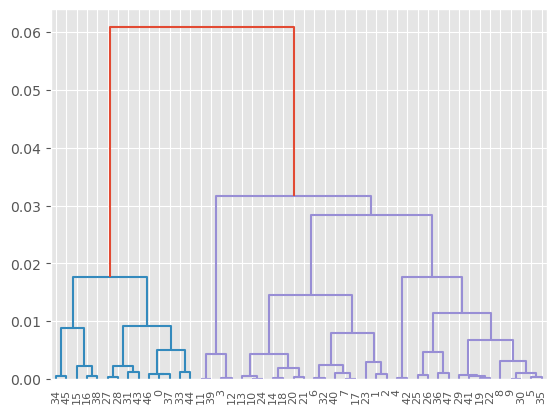

In [32]:
from scipy.cluster.hierarchy import dendrogram, linkage, fcluster

link = linkage(df_bus[['LATITUDE', 'LONGITUDE']], 'ward', 'euclidean')
dn = dendrogram(link)

Возьмем расстояние равное 0.02

In [33]:
df_bus['cluster'] = fcluster(link, 0.02, criterion='distance')
df_bus.head()

,STOP_NAME,LATITUDE,LONGITUDE,DISTANCE,cluster
ID_STOP,,,,,
1341,АВТОВСКАЯ УЛ. [72],59.869850,30.270802,0.612023,1
14715,"УЛ .ЗЕНИТЧИКОВ [66, 72, 2, 20, 200, 229]",59.874457,30.261841,0.799247,3
14813,"УЛ. ЗЕНИТЧИКОВ [66, 72, 2, 20, 200, 229] [тест]<",59.873700,30.262411,0.717439,3
1507,ДОРОГА НА ТУРУХТАННЫЕ ОСТРОВА [2],59.869534,30.247818,0.786625,2
15238,Проспект Стачек (20),59.859285,30.254761,0.960904,4


In [34]:
df_bus.groupby('cluster').size()

cluster
1    14
2     4
3    15
4    15
dtype: int64

Кластеры:

In [35]:
for i in range(1, df_bus.cluster.nunique() + 1):
    print(f'{i}-й кластер:')
    print(df_bus[df_bus.cluster == i].STOP_NAME)
    print()

1-й кластер:
ID_STOP
1341                             АВТОВСКАЯ УЛ. [72]
15865                         Улица Новостроек (46)
15906              Автовский ДСК (оборотная/ст, 46)
18031                  КРАСНОПУТИЛОВСКАЯ УЛ. (тест)
18052                 КРАСНОПУТИЛОВСКАЯ УЛ. (тест)<
2224                           УЛ. ЗАЙЦЕВА [66, 72]
2269                             УЛ. МАРИНЕСКО [66]
2396                  УЛ. ЧЕРВОНОГО КАЗАЧЕСТВА [72]
2552                            АВТОВСКАЯ УЛ. [72]<
25908                    Автовский ДСК (46 посадка)
3407                          УЛ. ЗАЙЦЕВА [66, 72]<
3451                            УЛ. МАРИНЕСКО [66]<
3581                 УЛ. ЧЕРВОНОГО КАЗАЧЕСТВА [72]<
3918     КРАСНОПУТИЛОВСКАЯ УЛ. УГ. АВТОВСКОЙ УЛ. []
Name: STOP_NAME, dtype: object

2-й кластер:
ID_STOP
1507              ДОРОГА НА ТУРУХТАННЫЕ ОСТРОВА [2]
15799    Дорога на Турухтанные острова (41, 46, 48)
15819    Дорога на Турухтанные острова (41, 46, 48)
2716             ДОРОГА НА ТУРУХТАННЫЕ ОСТ

Нарисуем кластеры на карте

In [36]:
sh = gps.read_file("Regions.shx")
spb = sh.loc[sh['NAME'] == 'Санкт-Петербург']
spb = spb.to_crs(epsg=3857)

In [37]:
from shapely.geometry import Point
from geopandas import GeoDataFrame

geometry = [Point(xy) for xy in zip(df_bus['LONGITUDE'], df_bus['LATITUDE'])]
gdf = GeoDataFrame(df_bus, geometry=geometry)
gdf.head()

,STOP_NAME,LATITUDE,LONGITUDE,DISTANCE,cluster,geometry
ID_STOP,,,,,,
1341,АВТОВСКАЯ УЛ. [72],59.869850,30.270802,0.612023,1,POINT (30.27080 59.86985)
14715,"УЛ .ЗЕНИТЧИКОВ [66, 72, 2, 20, 200, 229]",59.874457,30.261841,0.799247,3,POINT (30.26184 59.87446)
14813,"УЛ. ЗЕНИТЧИКОВ [66, 72, 2, 20, 200, 229] [тест]<",59.873700,30.262411,0.717439,3,POINT (30.26241 59.87370)
1507,ДОРОГА НА ТУРУХТАННЫЕ ОСТРОВА [2],59.869534,30.247818,0.786625,2,POINT (30.24782 59.86953)
15238,Проспект Стачек (20),59.859285,30.254761,0.960904,4,POINT (30.25476 59.85928)


In [38]:
gdf.set_crs(epsg=4326, inplace=True)
gdf = gdf.to_crs(spb.crs)

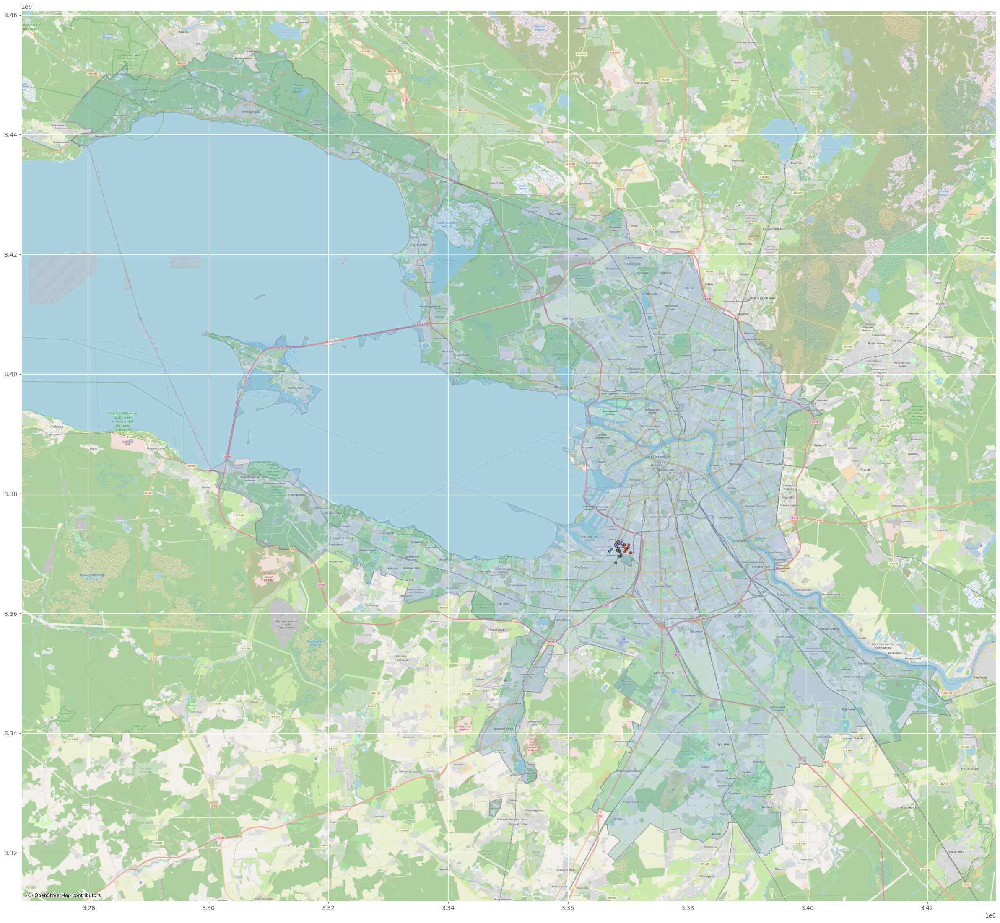

In [39]:
base = spb.plot(alpha=0.2, edgecolor='black', figsize=(30, 30))
gdf.groupby('cluster').plot(ax=base, marker='o', markersize=15, alpha=0.75, edgecolor='black')
ctx.add_basemap(base, zoom=12, source=ctx.providers.OpenStreetMap.Mapnik)

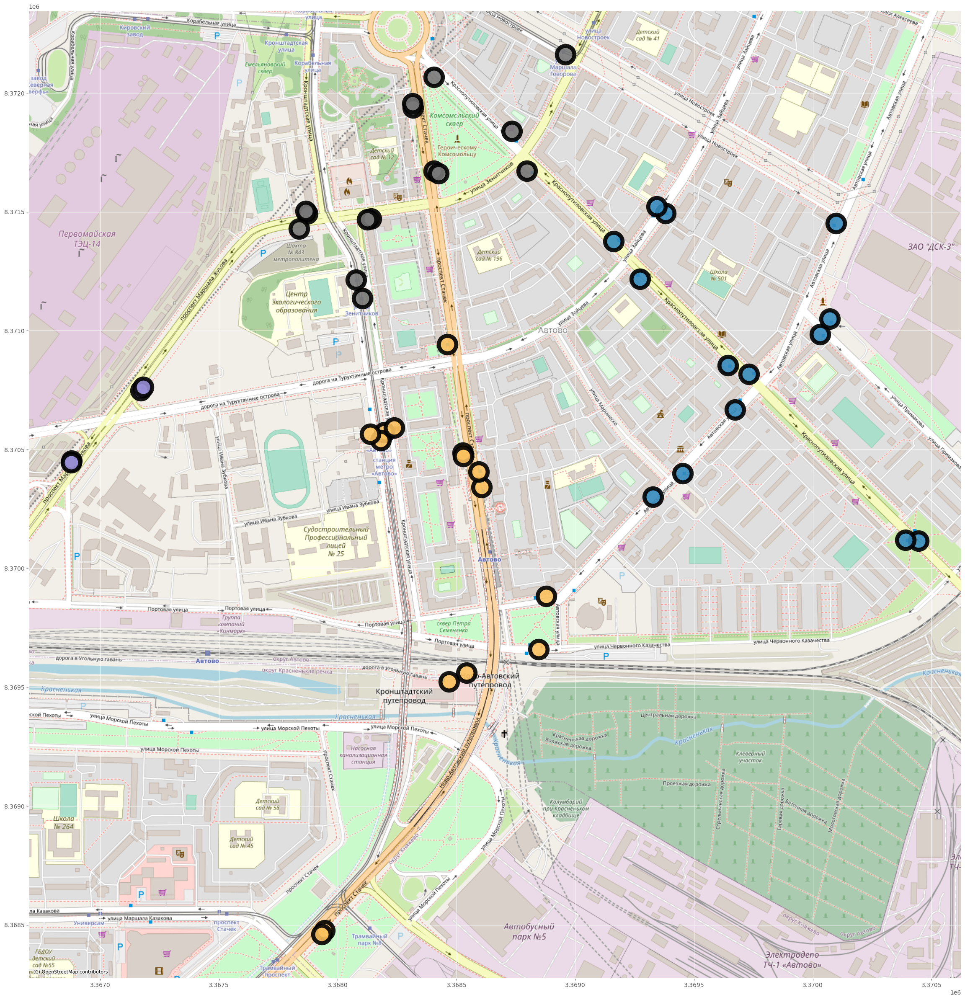

In [40]:
base = gdf.plot(alpha=0, edgecolor='black', figsize=(30, 30))
gdf.groupby('cluster').plot(ax=base, marker='o', markersize=900, edgecolor='black', linewidths=7, alpha=0.9);
ctx.add_basemap(base, source=ctx.providers.OpenStreetMap.Mapnik)